In [99]:
#Objetivo general: pronosticar con una exactitud de minimo 80% si el tumor o masa es benigno o maligno

#Importo los paquetes
import numpy as np
import pandas as pd
import scipy
import matplotlib.pyplot as plt
import seaborn as sns

#Estimators or algoritms 

from sklearn import linear_model
from sklearn.svm import SVC
from sklearn.feature_selection import RFE
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import StratifiedKFold
from sklearn.feature_selection import RFECV
from sklearn import svm
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import GridSearchCV
from scipy import stats

#Model Metrics

#  Metrics general crossvalidation
from sklearn.model_selection import cross_val_score

# Clasification Metrics
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import plot_confusion_matrix

In [2]:
#Importo el algotritmo de split para trining y testing
from sklearn.model_selection import train_test_split

In [3]:
#Importo el set de datos
data = pd.read_csv('data_bc_Wisconsin.csv', header = 0)

In [4]:
data.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [5]:
len(data)

569

In [6]:
#Se observa que en algunas variables la std es muy grande con respecto a la media, por lo que se debe revisar la distribución
# de los datos y es probable que se necesite realizar una normalización de los datos.
data.describe()

,id,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
count,5.690000e+02,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,3.037183e+07,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,...,16.269190,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946
std,1.250206e+08,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,...,4.833242,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061
min,8.670000e+03,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,...,7.930000,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040
25%,8.692180e+05,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,...,13.010000,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460
50%,9.060240e+05,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,...,14.970000,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040
75%,8.813129e+06,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,...,18.790000,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080
max,9.113205e+08,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,...,36.040000,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500


In [7]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 32 columns):
id                         569 non-null int64
diagnosis                  569 non-null object
radius_mean                569 non-null float64
texture_mean               569 non-null float64
perimeter_mean             569 non-null float64
area_mean                  569 non-null float64
smoothness_mean            569 non-null float64
compactness_mean           569 non-null float64
concavity_mean             569 non-null float64
concave points_mean        569 non-null float64
symmetry_mean              569 non-null float64
fractal_dimension_mean     569 non-null float64
radius_se                  569 non-null float64
texture_se                 569 non-null float64
perimeter_se               569 non-null float64
area_se                    569 non-null float64
smoothness_se              569 non-null float64
compactness_se             569 non-null float64
concavity_se               569 non

In [8]:
#Search for NAs
data.isnull()


,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
565,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
566,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
567,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


In [9]:
data.isnull().sum()

id                         0
diagnosis                  0
radius_mean                0
texture_mean               0
perimeter_mean             0
area_mean                  0
smoothness_mean            0
compactness_mean           0
concavity_mean             0
concave points_mean        0
symmetry_mean              0
fractal_dimension_mean     0
radius_se                  0
texture_se                 0
perimeter_se               0
area_se                    0
smoothness_se              0
compactness_se             0
concavity_se               0
concave points_se          0
symmetry_se                0
fractal_dimension_se       0
radius_worst               0
texture_worst              0
perimeter_worst            0
area_worst                 0
smoothness_worst           0
compactness_worst          0
concavity_worst            0
concave points_worst       0
symmetry_worst             0
fractal_dimension_worst    0
dtype: int64

In [10]:
header = data.dtypes.index
print(header)

Index(['id', 'diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean',
       'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean',
       'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se',
       'fractal_dimension_se', 'radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave points_worst',
       'symmetry_worst', 'fractal_dimension_worst'],
      dtype='object')


In [11]:
#Convierto la variable diagnosis a una variable binaria
diagnosis_num={'B':0, 'M':1} #Creo un diccionario
data['diagnosis'] = data['diagnosis'].map(diagnosis_num) #Realizo el cambio ligando el diccionario con la función map

In [12]:
data.head(20)

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,842302,1,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.26540,0.4601,0.11890
1,842517,1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.18600,0.2750,0.08902
2,84300903,1,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.24300,0.3613,0.08758
3,84348301,1,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.25750,0.6638,0.17300
4,84358402,1,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.16250,0.2364,0.07678
5,843786,1,12.45,15.70,82.57,477.1,0.12780,0.17000,0.15780,0.08089,...,15.47,23.75,103.40,741.6,0.1791,0.5249,0.5355,0.17410,0.3985,0.12440
6,844359,1,18.25,19.98,119.60,1040.0,0.09463,0.10900,0.11270,0.07400,...,22.88,27.66,153.20,1606.0,0.1442,0.2576,0.3784,0.19320,0.3063,0.08368
7,84458202,1,13.71,20.83,90.20,577.9,0.11890,0.16450,0.09366,0.05985,...,17.06,28.14,110.60,897.0,0.1654,0.3682,0.2678,0.15560,0.3196,0.11510
8,844981,1,13.00,21.82,87.50,519.8,0.12730,0.19320,0.18590,0.09353,...,15.49,30.73,106.20,739.3,0.1703,0.5401,0.5390,0.20600,0.4378,0.10720
9,84501001,1,12.46,24.04,83.97,475.9,0.11860,0.23960,0.22730,0.08543,...,15.09,40.68,97.65,711.4,0.1853,1.0580,1.1050,0.22100,0.4366,0.20750


In [13]:
#Verifico data tras el cambio
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 32 columns):
id                         569 non-null int64
diagnosis                  569 non-null int64
radius_mean                569 non-null float64
texture_mean               569 non-null float64
perimeter_mean             569 non-null float64
area_mean                  569 non-null float64
smoothness_mean            569 non-null float64
compactness_mean           569 non-null float64
concavity_mean             569 non-null float64
concave points_mean        569 non-null float64
symmetry_mean              569 non-null float64
fractal_dimension_mean     569 non-null float64
radius_se                  569 non-null float64
texture_se                 569 non-null float64
perimeter_se               569 non-null float64
area_se                    569 non-null float64
smoothness_se              569 non-null float64
compactness_se             569 non-null float64
concavity_se               569 non-

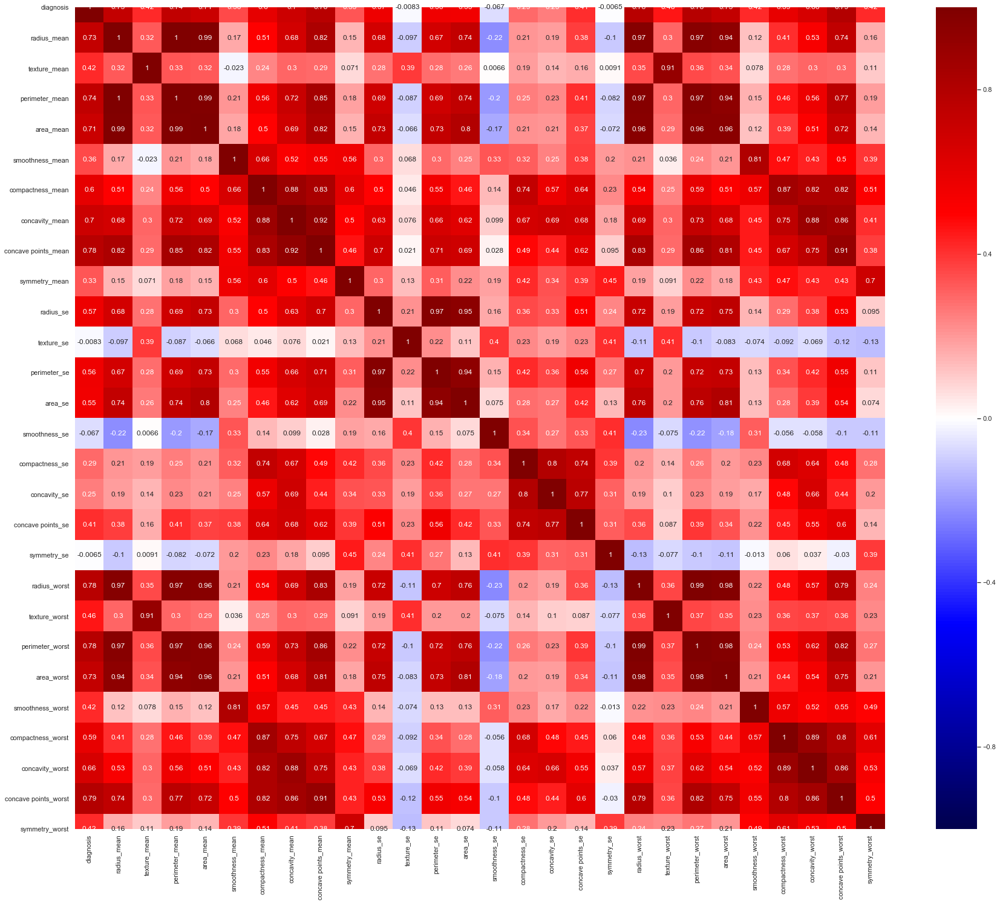

In [40]:
# Visualizacion de correlation con Seaborn
#Al analizar el resultado del heatmap de correlacion, se observa como la variable fractal_dimension_mean, fractal_dimension_se,
#fractal_dimension_worst presentan baja correlacion en comparacion con la correlacion de las otras variables. La variable id
# tambien presenta baja correlacion, pero este comportamiento ya era esperado.
sns.set(rc={'figure.figsize':(30,25)})
sns.heatmap(data.corr(), cmap="seismic", annot=True, vmin=-1, vmax=1)

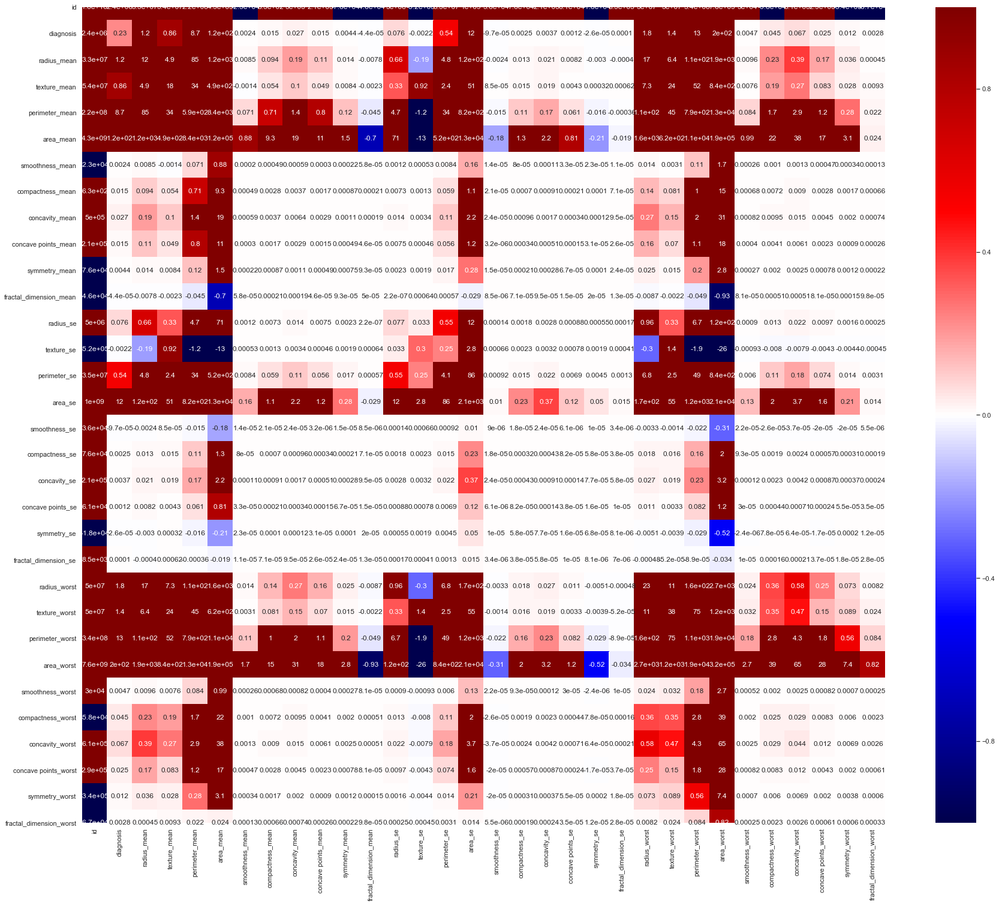

In [50]:
#Revision de la covarianza

sns.set(rc={'figure.figsize':(30,25)})
sns.heatmap(data.cov(), cmap="seismic", annot=True, vmin=-1, vmax=1)

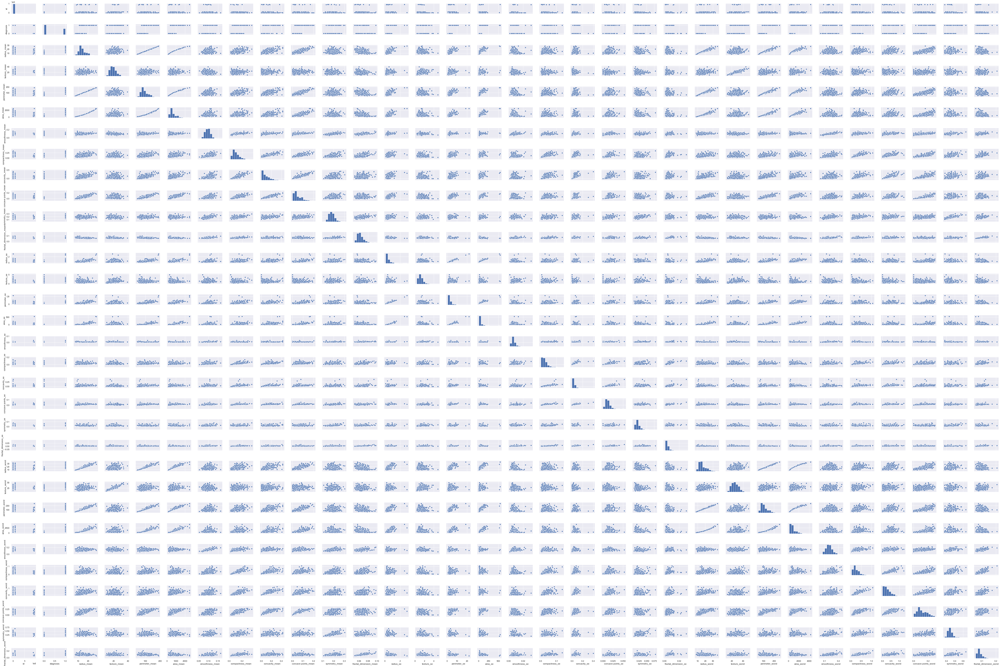

In [54]:
# Plot all of the variable-to-variable relations as scatterplots
# Al revisar los resultados de los scatter y de los histogramas se observa que varias variables no presentan simetria,
# ademas tambien presentan outliers, se requiere buscar la normalizacion de las variables
sns.pairplot(data, height=1.5, aspect=1.5);

In [15]:
## Procedo a elimianar variables con baja correlación y normalizar con la funcion log
# Al intentar esta opción se me indefine la variable concavity y concave por tener ceros, por lo que no puedo aplicar
# la transformación con log

data.drop(columns=['id', 'fractal_dimension_mean', 'fractal_dimension_se', 'fractal_dimension_worst' ], 
          axis=1, inplace=True)

#data['radius_mean'] = np.log( data['radius_mean'] )
#data['texture_mean'] = np.log( data['texture_mean'] )
#data['area_mean'] = np.log( data['area_mean'] )
#data['smoothness_mean'] = np.log( data['smoothness_mean'] )
#data['compactness_mean'] = np.log( data['compactness_mean'] )
#data['perimeter_mean'] = np.log( data['perimeter_mean'] )
#data['concavity_mean'] = np.log( data['concavity_mean'] ), se indefine si le aplico log
#data['concave points_mean'] = np.log( data['concave points_mean'] ), se indefine si le aplico log
#data['symmetry_mean'] = np.log( data['symmetry_mean'] )
#data['radius_se'] = np.log( data['radius_se'] )
#data['texture_se'] = np.log( data['texture_se'] )
#data['perimeter_se'] = np.log( data['perimeter_se'] )
#data['area_se'] = np.log( data['area_se'] )
#data['smoothness_se'] = np.log( data['smoothness_se'] )
#data['compactness_se'] = np.log( data['compactness_se'] )
#data['concavity_se'] = np.log( data['concavity_se'] ), se indefine si le aplico log
#data['concave points_se'] = np.log( data['concave points_se'] ), se indefine si le aplico log
#data['symmetry_se'] = np.log( data['symmetry_se'] )
#data['radius_worst'] = np.log( data['radius_worst'] )
#data['texture_worst'] = np.log( data['texture_worst'] )
#data['perimeter_worst'] = np.log( data['perimeter_worst'] )
#data['area_worst'] = np.log( data['area_worst'] )
#data['smoothness_worst'] = np.log( data['smoothness_worst'] )
#data['compactness_worst'] = np.log( data['compactness_worst'] )
#data['concavity_worst'] = np.log( data['concavity_worst'] ), se indefine si le aplico log
#data['concave points_worst'] = np.log( data['concave points_worst'] ), se indefine si le aplico log
#data['symmetry_worst'] = np.log( data['symmetry_worst'] )





In [17]:
data.head()

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,symmetry_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst
0,1,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,...,0.03003,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601
1,1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,...,0.01389,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750
2,1,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,...,0.02250,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613
3,1,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,...,0.05963,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638
4,1,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,...,0.01756,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364


In [18]:
#Procedo a aplicar PowerTransformer con el method='yeo-johnson', ya que este si puede normalizar zeros, e incluso 
#valores negativos

#1 Divido el data set en features y target

features = data.iloc[:, 1:28 ]
target = data.diagnosis

In [19]:
features.head()


,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,radius_se,...,symmetry_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,1.0950,...,0.03003,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.5435,...,0.01389,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.7456,...,0.02250,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.4956,...,0.05963,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.7572,...,0.01756,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364


In [20]:
target.head()

0    1
1    1
2    1
3    1
4    1
Name: diagnosis, dtype: int64

In [21]:
#2 Utilizo PowerTransformer que aplica el method='yeo-johnson'
from sklearn.preprocessing import PowerTransformer
pt = PowerTransformer()

pt.fit(features)
features = pt.transform(features)

features = pd.DataFrame(features)
features.columns = (data.drop(['diagnosis'], axis = 1)).columns



C:\Users\Frass\Anaconda3\lib\site-packages\sklearn\preprocessing\_data.py:2982: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())


In [22]:
features.head()

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,radius_se,...,symmetry_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst
0,1.134881,-2.678666,1.259822,0.0,1.504114,2.165938,1.862988,1.848558,1.953067,1.892785,...,1.355589,1.619635,-1.488367,1.810506,0.0,1.282792,1.942737,1.730182,1.935654,2.197206
1,1.619346,-0.264377,1.528723,0.0,-0.820227,-0.384102,0.291976,0.820609,0.102291,0.958616,...,-1.028611,1.578689,-0.288382,1.430616,0.0,-0.325080,-0.296580,0.070746,1.101594,-0.121997
2,1.464796,0.547806,1.454664,0.0,0.963977,1.163977,1.403673,1.683104,0.985668,1.457817,...,0.568436,1.419757,0.071406,1.321941,0.0,0.580301,1.209701,1.005512,1.722744,1.218181
3,-0.759262,0.357721,-0.514886,0.0,2.781494,2.197843,1.642391,1.423004,2.360528,0.791676,...,2.350939,-0.083692,0.228089,-0.039480,0.0,2.857821,2.282276,1.675087,1.862378,3.250202
4,1.571260,-1.233520,1.583340,0.0,0.343932,0.762392,1.407479,1.410929,0.090964,1.479006,...,-0.227814,1.293727,-1.637882,1.316582,0.0,0.284367,-0.131829,0.817474,0.807077,-0.943554


In [23]:
#Verfico la longitud de las variables
len(features)

569

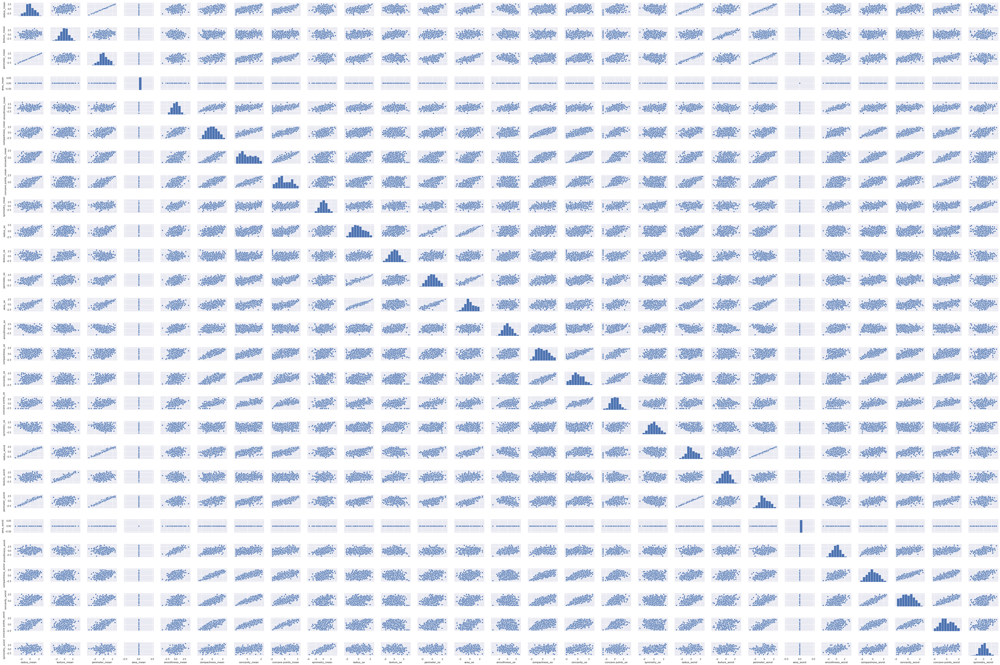

In [58]:
# Plot denuevo para ver cambios en simetria
sns.pairplot(features, height=1.5, aspect=1.5);


In [24]:
# Elimino las variables de área por que afectan el analisis

features.drop(columns=['area_mean', 'area_se', 'area_worst'], 
          axis=1, inplace=True)

In [25]:
features.head()

,radius_mean,texture_mean,perimeter_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,radius_se,texture_se,...,concave points_se,symmetry_se,radius_worst,texture_worst,perimeter_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst
0,1.134881,-2.678666,1.259822,1.504114,2.165938,1.862988,1.848558,1.953067,1.892785,-0.498201,...,0.810200,1.355589,1.619635,-1.488367,1.810506,1.282792,1.942737,1.730182,1.935654,2.197206
1,1.619346,-0.264377,1.528723,-0.820227,-0.384102,0.291976,0.820609,0.102291,0.958616,-0.998312,...,0.426936,-1.028611,1.578689,-0.288382,1.430616,-0.325080,-0.296580,0.070746,1.101594,-0.121997
2,1.464796,0.547806,1.454664,0.963977,1.163977,1.403673,1.683104,0.985668,1.457817,-0.833982,...,1.423361,0.568436,1.419757,0.071406,1.321941,0.580301,1.209701,1.005512,1.722744,1.218181
3,-0.759262,0.357721,-0.514886,2.781494,2.197843,1.642391,1.423004,2.360528,0.791676,0.097022,...,1.191720,2.350939,-0.083692,0.228089,-0.039480,2.857821,2.282276,1.675087,1.862378,3.250202
4,1.571260,-1.233520,1.583340,0.343932,0.762392,1.407479,1.410929,0.090964,1.479006,-0.850908,...,1.214491,-0.227814,1.293727,-1.637882,1.316582,0.284367,-0.131829,0.817474,0.807077,-0.943554


Text(0.5, 1.0, 'Distribucion de radius_mean')

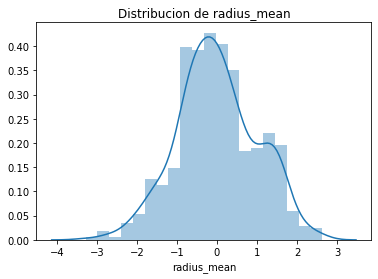

In [26]:
#Revision de la distribucion de las variables despues de normalizar
#Con esto se busca verificar que las distribuciones presentan un comportamiento cercano a la normalidad

radiom_dist1 = sns.distplot(features['radius_mean'])
radiom_dist1.set_title("Distribucion de radius_mean")

Text(0.5, 1.0, 'Distribucion de texture_mean')

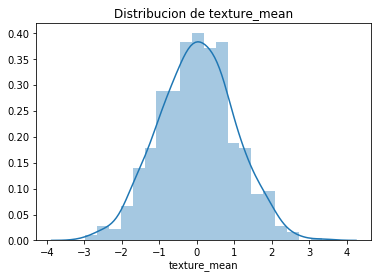

In [27]:
texturem_dist1 = sns.distplot(features['texture_mean'])
texturem_dist1.set_title("Distribucion de texture_mean")

Text(0.5, 1.0, 'Distribucion de texture_mean')

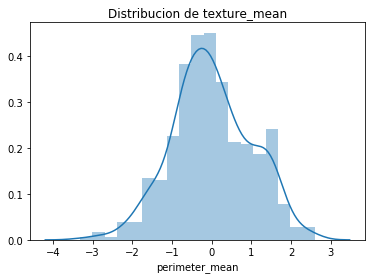

In [28]:
perimeterm_dist1 = sns.distplot(features['perimeter_mean'])
perimeterm_dist1.set_title("Distribucion de texture_mean")

In [29]:
#aream_dist1 = sns.distplot(features['area_mean'])
#aream_dist1.set_title("Distribucion de area_mean")

Text(0.5, 1.0, 'Distribucion de area_mean')

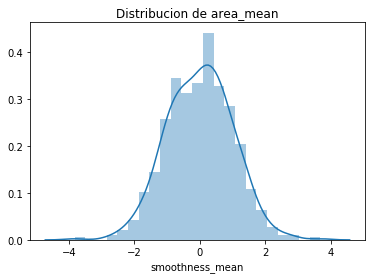

In [30]:
smootnessm_dist1 = sns.distplot(features['smoothness_mean'])
smootnessm_dist1.set_title("Distribucion de area_mean")


Text(0.5, 1.0, 'Distribucion de compactness_mean')

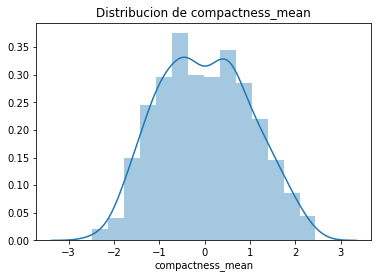

In [31]:
compactnessm_dist1 = sns.distplot(features['compactness_mean'])
compactnessm_dist1.set_title("Distribucion de compactness_mean")

Text(0.5, 1.0, 'Distribucion de concavity_mean')

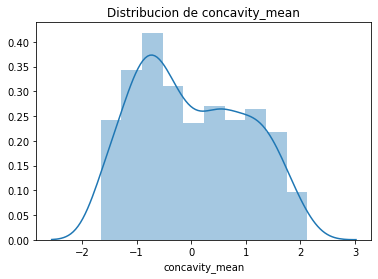

In [32]:
concavitym_dist1 = sns.distplot(features['concavity_mean'])
concavitym_dist1.set_title("Distribucion de concavity_mean")

Text(0.5, 1.0, 'Distribucion de concave points_mean')

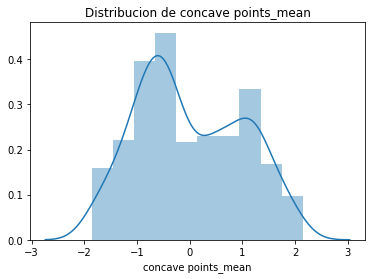

In [33]:
concavem_dist1 = sns.distplot(features['concave points_mean'])
concavem_dist1.set_title("Distribucion de concave points_mean")

Text(0.5, 1.0, 'Distribucion desymmetry_mean')

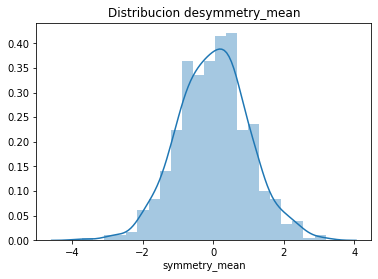

In [34]:
symmetrym_dist1 = sns.distplot(features['symmetry_mean'])
symmetrym_dist1.set_title("Distribucion desymmetry_mean")



Text(0.5, 1.0, 'Distribucion de radius_worst')

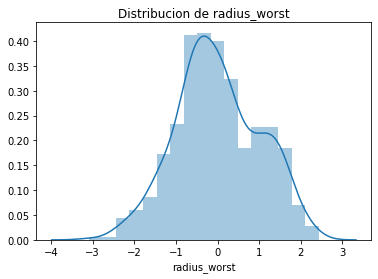

In [35]:
radiusw_dist1 = sns.distplot(features['radius_worst'])
radiusw_dist1.set_title("Distribucion de radius_worst")

Text(0.5, 1.0, 'Distribucion de perimeter')

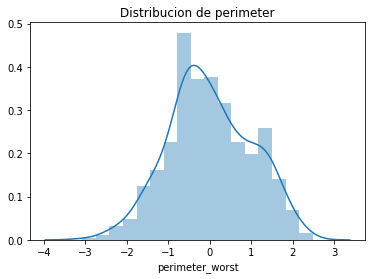

In [36]:
perimeterw_dist1 = sns.distplot(features['perimeter_worst'])
perimeterw_dist1.set_title("Distribucion de perimeter")

In [37]:
#areaw_dist1 = sns.distplot(data['area_worst'])
#areaw_dist1.set_title("Distribucion de area worst")

Text(0.5, 1.0, 'Distribucion de concave worst')

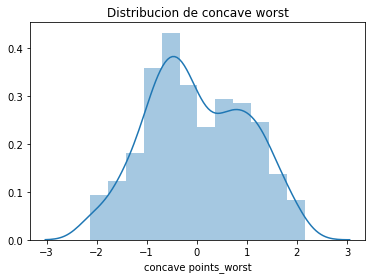

In [38]:
concavew_dist1 = sns.distplot(features['concave points_worst'])
concavew_dist1.set_title("Distribucion de concave worst")

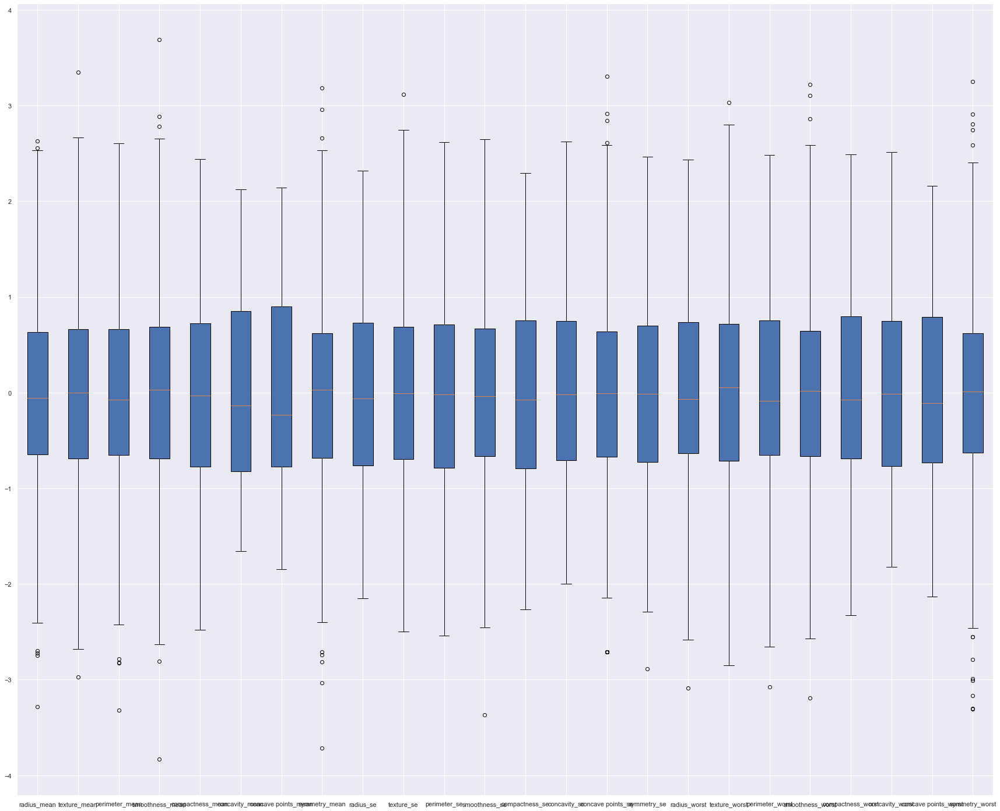

In [41]:
#Reviso la variabilidad de los datos 
# La mayoria de las variables presentan una variabilidad similar y pocos outliers, se puede observar como el centro de 
#los datos se ubican en una posición similar.

A = features['radius_mean'] 
B = features['texture_mean'] 
C = features['perimeter_mean']
D = features['smoothness_mean']
E = features['compactness_mean'] 
F = features['concavity_mean']
G = features['concave points_mean']
H = features['symmetry_mean'] 
I = features['radius_se'] 
J = features['texture_se'] 
K = features['perimeter_se']
L = features['smoothness_se']
M = features['compactness_se']
N = features['concavity_se']
O = features['concave points_se']
P = features['symmetry_se'] 
Q = features['radius_worst'] 
R = features['texture_worst']
S = features['perimeter_worst']
T = features['smoothness_worst'] 
V = features['compactness_worst'] 
W = features['concavity_worst'] 
X = features['concave points_worst'] 
Y = features['symmetry_worst']

box_plot_data = [A,B,C,D,E,F,G,H,I,J,K,L,M,N,O,P,Q,R,S,T,V,W,X,Y]
    
plt.boxplot(box_plot_data,patch_artist=True,labels=['radius_mean', 'texture_mean', 'perimeter_mean','smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave points_mean', 'symmetry_mean', 'radius_se', 'texture_se', 'perimeter_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se', 'radius_worst', 'texture_worst',
       'perimeter_worst','smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave points_worst',
       'symmetry_worst'])
plt.show()

In [42]:
# Feature Engineering
# Ya se eliminaron una serie de variables, pero se aplicara RFEC para detectar opciones de mejora.

# Load the digits dataset
X = features
y = target

#Se crea el clasificador para RFE y RFE
rfc = RandomForestClassifier(random_state=101)
rfecv = RFECV(estimator=rfc, step=1, cv=StratifiedKFold(10), scoring='accuracy')
rfecv.fit(X, y)


RFECV(cv=StratifiedKFold(n_splits=10, random_state=None, shuffle=False),
      estimator=RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                       class_weight=None, criterion='gini',
                                       max_depth=None, max_features='auto',
                                       max_leaf_nodes=None, max_samples=None,
                                       min_impurity_decrease=0.0,
                                       min_impurity_split=None,
                                       min_samples_leaf=1, min_samples_split=2,
                                       min_weight_fraction_leaf=0.0,
                                       n_estimators=100, n_jobs=None,
                                       oob_score=False, random_state=101,
                                       verbose=0, warm_start=False),
      min_features_to_select=1, n_jobs=None, scoring='accuracy', step=1,
      verbose=0)

In [43]:
#Impresion de las variables seleccionadas
print('Optimal number of features: {}'.format(rfecv.n_features_))

Optimal number of features: 16


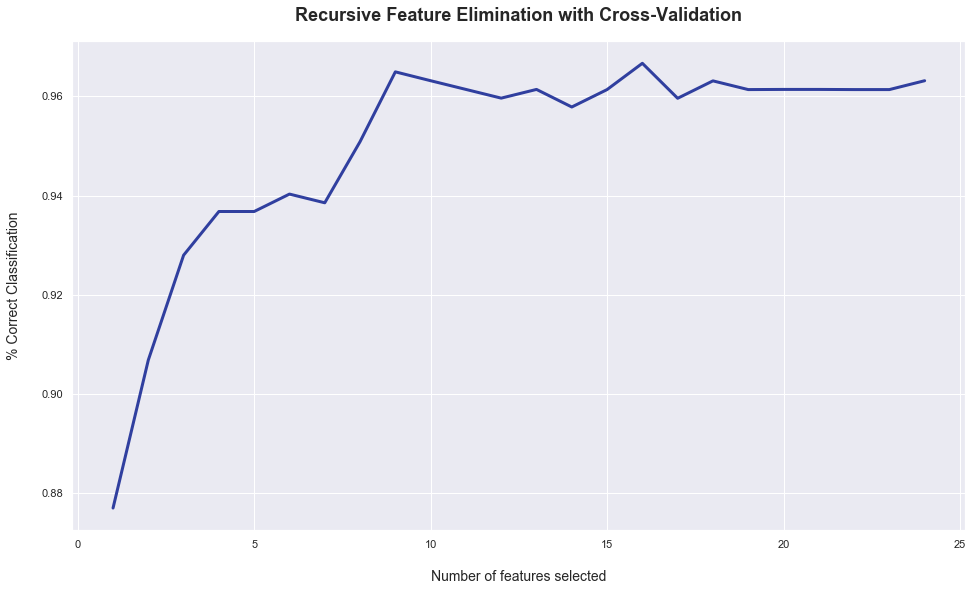

In [44]:
# Grafico la cantiadad necesaria de features
plt.figure(figsize=(16, 9))

plt.title('Recursive Feature Elimination with Cross-Validation', fontsize=18, fontweight='bold', pad=20)

plt.xlabel('Number of features selected', fontsize=14, labelpad=20)

plt.ylabel('% Correct Classification', fontsize=14, labelpad=20)

plt.plot(range(1, len(rfecv.grid_scores_) + 1), rfecv.grid_scores_, color='#303F9F', linewidth=3)

plt.show()

In [45]:
# Elimino las variables que tienen poco aporte con el siguiente script:
#Procedo a eliminar todas las variables que no aportan de acuerdo a RFEC
# Al hacer esto nos quedamos con 16 variables como lo indica el algoritmo

print(np.where(rfecv.support_ == False)[0])

X.drop(X.columns[np.where(rfecv.support_ == False)[0]], axis=1, inplace=True)

#Se elimina o sacan las variables 3  7  9 11 12 14 15 20, smoothness_mean, symmetry_mean, texture_se, smoothness_se,
# compactness_se,concave points_se, symmetry_se y compactness_worst

[ 3  7  9 11 12 14 15 20]


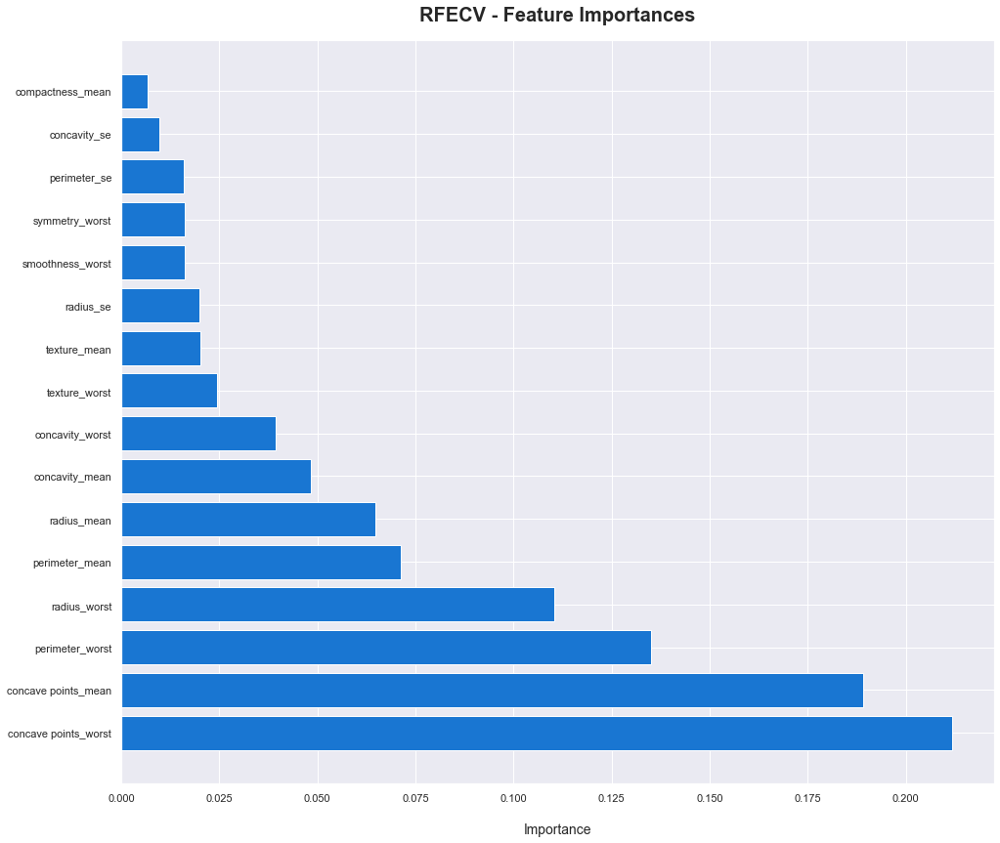

In [46]:
#Procedo a generar un grafico de las variables mas importantes>

dset = pd.DataFrame()

dset['attr'] = X.columns

dset['importance'] = rfecv.estimator_.feature_importances_

dset = dset.sort_values(by='importance', ascending=False)

plt.figure(figsize=(16, 14))

plt.barh(y=dset['attr'], width=dset['importance'], color='#1976D2')

plt.title('RFECV - Feature Importances', fontsize=20, fontweight='bold', pad=20)

plt.xlabel('Importance', fontsize=14, labelpad=20)

plt.show()

In [47]:
#Reviso las variables que me quedan
features.head()

,radius_mean,texture_mean,perimeter_mean,compactness_mean,concavity_mean,concave points_mean,radius_se,perimeter_se,concavity_se,radius_worst,texture_worst,perimeter_worst,smoothness_worst,concavity_worst,concave points_worst,symmetry_worst
0,1.134881,-2.678666,1.259822,2.165938,1.862988,1.848558,1.892785,1.973081,1.155514,1.619635,-1.488367,1.810506,1.282792,1.730182,1.935654,2.197206
1,1.619346,-0.264377,1.528723,-0.384102,0.291976,0.820609,0.958616,0.732407,-0.463804,1.578689,-0.288382,1.430616,-0.325080,0.070746,1.101594,-0.121997
2,1.464796,0.547806,1.454664,1.163977,1.403673,1.683104,1.457817,1.213029,0.595624,1.419757,0.071406,1.321941,0.580301,1.005512,1.722744,1.218181
3,-0.759262,0.357721,-0.514886,2.197843,1.642391,1.423004,0.791676,0.756164,1.240838,-0.083692,0.228089,-0.039480,2.857821,1.675087,1.862378,3.250202
4,1.571260,-1.233520,1.583340,0.762392,1.407479,1.410929,1.479006,1.451685,1.248567,1.293727,-1.637882,1.316582,0.284367,0.817474,0.807077,-0.943554


In [48]:
#Realizo el split de los datos
X_train1, X_test1, Y_train1, Y_test1 = train_test_split(features, target, test_size = 0.2)


In [49]:
#Reviso el tamaño de los set de datos
X_train1.shape, X_test1.shape, Y_train1.shape, Y_test1.shape

((455, 16), (114, 16), (455,), (114,))

In [79]:
#Inicio el entrenamiento de los modelos

#1. Modelo número 1. SVC
#Construccion del modelo
modelSVM1 = SVC() 

parametersSVM = {'kernel' : ['linear', 'rbf'],
                'C' : [0.1, 1, 5]}

cvSVC = GridSearchCV(modelSVM1, parametersSVM, cv = 5 )

cvSVC.fit(X_train1, Y_train1)

 

GridSearchCV(cv=5, error_score=nan,
             estimator=SVC(C=1.0, break_ties=False, cache_size=200,
                           class_weight=None, coef0=0.0,
                           decision_function_shape='ovr', degree=3,
                           gamma='scale', kernel='rbf', max_iter=-1,
                           probability=False, random_state=None, shrinking=True,
                           tol=0.001, verbose=False),
             iid='deprecated', n_jobs=None,
             param_grid={'C': [0.1, 1, 5], 'kernel': ['linear', 'rbf']},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=0)

In [80]:
print(cross_val_score(cvSVC, X_train1, Y_train1)) # Ejecucion del resultado de crossvalidation
cvSVC.score(X_train1, Y_train1) # Accuracy

[0.98901099 1.         0.97802198 0.95604396 0.96703297]


0.9824175824175824

In [81]:
#Prediccion y evaluacion del modelo

predictSVM1 = cvSVC.predict(X_test1)
print(classification_report(Y_test1, predictSVM1))
print('Accuracy:', accuracy_score(Y_test1, predictSVM1))
pd.DataFrame(confusion_matrix(Y_test1, predictSVM1),
             columns=['Predicted No Maligno', 'Predicted Maligno'],
             index=['True Not Maligno', 'True Maligno'])

              precision    recall  f1-score   support

           0       0.97      0.97      0.97        74
           1       0.95      0.95      0.95        40

    accuracy                           0.96       114
   macro avg       0.96      0.96      0.96       114
weighted avg       0.96      0.96      0.96       114

Accuracy: 0.9649122807017544


,Predicted No Maligno,Predicted Maligno
True Not Maligno,72,2
True Maligno,2,38


In [76]:
#2. Modelo número 2. Random Forest

modelRF1 = RandomForestClassifier()

parametersRF = { 'n_estimators' : [100],
             'max_depth' : [5, 6, 10, None]}

cvRF = GridSearchCV(modelRF1, parametersRF, cv = 5 )

cvRF.fit(X_train1, Y_train1)

GridSearchCV(cv=5, error_score=nan,
             estimator=RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                              class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              max_samples=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators=100, n_jobs=None,
                                              oob_score=False,
                                              rando

In [77]:
print(cross_val_score(cvRF, X_train1, Y_train1)) # Ejecucion del resultado de crossvalidation
cvRF.score(X_train1, Y_train1) # Accuracy

[0.95604396 0.95604396 0.97802198 0.95604396 0.96703297]


0.9934065934065934

In [82]:
#Prediccion y evaluacion del modelo

predictRF1 = cvRF.predict(X_test1)
print(classification_report(Y_test1, predictRF1))
print('Accuracy:', accuracy_score(Y_test1, predictRF1))
pd.DataFrame(confusion_matrix(Y_test1, predictRF1),
             columns=['Predicted No Maligno', 'Predicted Maligno'],
             index=['True Not Maligno', 'True Maligno'])

              precision    recall  f1-score   support

           0       0.97      0.97      0.97        74
           1       0.95      0.95      0.95        40

    accuracy                           0.96       114
   macro avg       0.96      0.96      0.96       114
weighted avg       0.96      0.96      0.96       114

Accuracy: 0.9649122807017544


,Predicted No Maligno,Predicted Maligno
True Not Maligno,72,2
True Maligno,2,38


In [153]:
#3. Modelo número 3. Gradient Boosting Classifier

modelGB1 = GradientBoostingClassifier()

parametersGB = {'n_estimators': [5, 50, 100, 200, 500],
               'max_depth': [1, 3, 5, 7, 9],
               'learning_rate': [0.01, 0.1, 1]}

cvGB = GridSearchCV(modelGB1, parametersGB, cv = 10 )

cvGB.fit(X_train1, Y_train1)

GridSearchCV(cv=10, error_score=nan,
             estimator=GradientBoostingClassifier(ccp_alpha=0.0,
                                                  criterion='friedman_mse',
                                                  init=None, learning_rate=0.1,
                                                  loss='deviance', max_depth=3,
                                                  max_features=None,
                                                  max_leaf_nodes=None,
                                                  min_impurity_decrease=0.0,
                                                  min_impurity_split=None,
                                                  min_samples_leaf=1,
                                                  min_samples_split=2,
                                                  min_weight_fraction_leaf=0.0,
                                                  n_estimators=100,
                                                  n_iter_no_change=None,
        

In [154]:
print(cross_val_score(cvGB, X_train1, Y_train1)) # Ejecucion del resultado de crossvalidation
cvGB.score(X_train1, Y_train1) # Accuracy

[0.96703297 0.97802198 0.98901099 0.97802198 0.96703297]


1.0

In [155]:
#Prediccion y evaluacion del modelo

predictGB1 = cvGB.predict(X_test1)
print(classification_report(Y_test1, predictGB1))
print('Accuracy:', accuracy_score(Y_test1, predictGB1))
pd.DataFrame(confusion_matrix(Y_test1, predictGB1),
             columns=['Predicted No Maligno', 'Predicted Maligno'],
             index=['True Not Maligno', 'True Maligno'])

              precision    recall  f1-score   support

           0       0.97      0.99      0.98        74
           1       0.97      0.95      0.96        40

    accuracy                           0.97       114
   macro avg       0.97      0.97      0.97       114
weighted avg       0.97      0.97      0.97       114

Accuracy: 0.9736842105263158


,Predicted No Maligno,Predicted Maligno
True Not Maligno,73,1
True Maligno,2,38


In [149]:
#4. Modelo número 4. Desicion Tree

modelDT1 = DecisionTreeClassifier()

parametersDT = {'max_depth': [1, 3, 5, 7, 9]}

cvRF = GridSearchCV(modelDT1, parametersDT, cv = 10 )

cvRF.fit(X_train1, Y_train1)

GridSearchCV(cv=10, error_score=nan,
             estimator=DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort='deprecated',
                                              random_state=None,
                                              splitter='best'),
             iid='deprecated', n_jobs=None,
             param_grid={'max_depth': [1, 3, 5, 7, 9]}, pre_dispatch='2*n_job

In [150]:
print(cross_val_score(cvRF, X_train1, Y_train1)) # Ejecucion del resultado de crossvalidation
cvRF.score(X_train1, Y_train1) # Accuracy

[0.95604396 0.93406593 0.94505495 0.94505495 0.96703297]


1.0

In [151]:
#Prediccion y evaluacion del modelo
#**Este modelo presento el valor de recall mas alto para la prediccion de tumores malignos**.

predictRF1 = cvRF.predict(X_test1)
print(classification_report(Y_test1, predictRF1))
print('Accuracy:', accuracy_score(Y_test1, predictRF1))
pd.DataFrame(confusion_matrix(Y_test1, predictRF1),
             columns=['Predicted No Maligno', 'Predicted Maligno'],
             index=['True Not Maligno', 'True Maligno'])


              precision    recall  f1-score   support

           0       0.99      0.96      0.97        74
           1       0.93      0.97      0.95        40

    accuracy                           0.96       114
   macro avg       0.96      0.97      0.96       114
weighted avg       0.97      0.96      0.97       114

Accuracy: 0.9649122807017544


,Predicted No Maligno,Predicted Maligno
True Not Maligno,71,3
True Maligno,1,39


In [159]:
# Comparacion de los modelos
#Es importante tener en cuenta que el indicador mas importante es recall, por el hecho de que es preferible 
# tener un falso positivo que un falso negativo. Se busca que recall sea lo mas cercano a 1 posible y 
# despues de este indicador el segundo en importancia es accuracy, que también se busca que este lo mas cercano 
# a 1 que sea posible. Por lo anterior, pese a que Gradient Boosting Classifier presento un mejor accuracy y un recall general
# con un valr mas alto, el recall del Random Forest para los tumores malignos verdaderos fue de 0.97, 
# siendo el mayor de los cuatro modelos, por este motivo se selecciona RF como el modelo seleccionado.


A1 = recall_score(Y_test1, predictSVM1, average='weighted')
B1 = recall_score(Y_test1, predictRF1, average='weighted') 
C1 = recall_score(Y_test1, predictGB1, average='weighted')
D1 = recall_score(Y_test1, predictRF1, average='weighted')
 


plot_data1 = [A1,B1,C1,D1]

metrics_plot1 = pd.DataFrame(plot_data1,
             index = ['predictSVM1', 'predictRF1', 'predictGB1', 'predictRF1'],
            columns = ['Recall general para los Modelos'])

    
metrics_plot1
           

,Recall general para los Modelos
predictSVM1,0.964912
predictRF1,0.964912
predictGB1,0.973684
predictRF1,0.964912
